# Pix2Pix (Image-to-Image with Conditional Adversarial Networks)  
- pytorch로 구현  
  
  
- Pix2Pix의 input과 output 살펴보기
<img src = "https://www.secmem.org/assets/images/pix2pix/pix2pix_images.jpg">

### Packages and Modules

In [1]:
import os
import random
import time
import glob
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchvision.datasets import ImageFolder
from torchsummary import summary

In [2]:
%matplotlib inline

In [3]:
import warnings
warnings.filterwarnings('ignore')

### Set GPU device

In [4]:
device = torch.device('cuda')
print(device)

cuda


### Load data and preprocessing

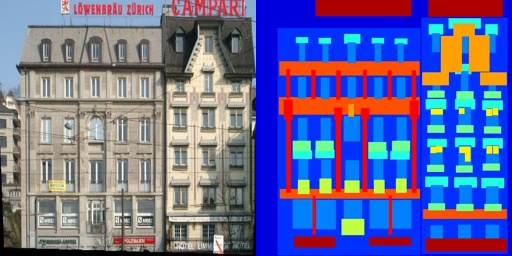

In [5]:
# show sample image
path = r'C:\Users\user\MY_DL\GAN\pix2pix_datas\building\building (1).jpg'
Image.open(path)

In [6]:
# custom dataset
class ImageDataset(Dataset):
    def __init__(self, path, transforms_=None):
        # image transform
        self.transform = transforms.Compose(transforms_)
        self.files = glob.glob(path+'/**/*.jpg')
        
    def __getitem__(self, index):
        img = Image.open(self.files[index%len(self.files)])
        w, h = img.size
        img_A = img.crop((0,0,w/2,h))
        img_B = img.crop((w/2,0,w,h))
        
        img_A = self.transform(img_A)
        img_B = self.transform(img_B)
        
        return img_A, img_B
    
    def __len__(self):
        return len(self.files)

In [7]:
path = 'pix2pix_datas'
batch_size = 32
target_size = (256,256)

transforms_ = [
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5)),
    transforms.Resize(target_size)
]

dataloader = DataLoader(
    ImageDataset(path, transforms_=transforms_),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True
)

### Define Models

In [8]:
# define encoder network
class UNetEncoder(nn.Module):
    def __init__(self, in_dim, out_dim, normalize=True, dropout=0.2):
        super(UNetEncoder, self).__init__()
        # build down sampling layer
        layers = [nn.Conv2d(in_dim, out_dim, kernel_size=4, stride=2, padding=1)]
        # add batch normalization layer
        if normalize:
            layers.append(nn.InstanceNorm2d(out_dim))
        # leaky relu activation function
        layers.append(nn.LeakyReLU(0.2))
        # add dropout layer
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [9]:
# define decoder network
class UNetDecoder(nn.Module):
    def __init__(self, in_dim, out_dim, dropout=0.2):
        super(UNetDecoder, self).__init__()
        # build up sampling layer and batch normalization and relu activatoin
        layers = [
            nn.ConvTranspose2d(in_dim, out_dim, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(out_dim),
            nn.ReLU(inplace=True),
        ]
        # add dropout layer
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)
    
    def forward(self, x, skip_layer):
        x = self.model(x)
        x = torch.cat((x, skip_layer), 1)
        return x

In [10]:
# define generator model
class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(Generator, self).__init__()
        # input size is 3x256x256
        self.encoder1 = UNetEncoder(in_channels, 64, normalize=False)
        # output size is 64x128x128
        self.encoder2 = UNetEncoder(64, 128)
        # output size is 128x64x64
        self.encoder3 = UNetEncoder(128, 256)
        # output size is 256x32x32
        self.encoder4 = UNetEncoder(256, 512, dropout=0.2)
        # output size is 512x16x16
        self.encoder5 = UNetEncoder(512, 512, dropout=0.2)
        # output size is 512x8x8
        self.encoder6 = UNetEncoder(512, 512, dropout=0.2)
        # output size is 512x4x4
        self.encoder7 = UNetEncoder(512, 512, dropout=0.2)
        # output size is 512x2x2
        self.encoder8 = UNetEncoder(512, 512, normalize=False, dropout=0.2)
        
        # input size is 512x1x1
        self.decoder1 = UNetDecoder(512, 512, dropout=0.2)
        # output size is 512x2x2 + skip layer down6 (512x2x2)
        self.decoder2 = UNetDecoder(1024, 512, dropout=0.2)
        # output size is 512x4x4 + skip layer down5 (512x4x4)
        self.decoder3 = UNetDecoder(1024, 512, dropout=0.2)
        # output size is 512x8x8 + skip layer down4 (512x8x8)
        self.decoder4 = UNetDecoder(1024, 512, dropout=0.2)
        # output size is 512x16x16 + skip layer down3 (512x16x16)
        self.decoder5 = UNetDecoder(1024, 256, dropout=0.2)
        # output size is 256x32x32 + skip layer down3 (256x32x32)
        self.decoder6 = UNetDecoder(512, 128)
        # output size is 128x64x64 + skip layer down2 (128x64x64)
        self.decoder7 = UNetDecoder(256, 64)
        # output size is 64x128x128 + skip layer down1 (64x128x128)
        self.decoder8 = nn.Sequential(
            nn.ConvTranspose2d(128, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
        # output size is 3x256x256
        
    def forward(self, x):
        # down-sampling
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)
        e5 = self.encoder5(e4)
        e6 = self.encoder6(e5)
        e7 = self.encoder7(e6)
        e8 = self.encoder8(e7)
        # up-sampling with concatenate skip layers
        d1 = self.decoder1(e8, e7)
        d2 = self.decoder2(d1, e6)
        d3 = self.decoder3(d2, e5)
        d4 = self.decoder4(d3, e4)
        d5 = self.decoder5(d4, e3)
        d6 = self.decoder6(d5, e2)
        d7 = self.decoder7(d6, e1)
        d8 = self.decoder8(d7)
        return d8

In [11]:
# check generator model summary
g = Generator().cuda()
summary(g, (3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
         LeakyReLU-2         [-1, 64, 128, 128]               0
           Dropout-3         [-1, 64, 128, 128]               0
       UNetEncoder-4         [-1, 64, 128, 128]               0
            Conv2d-5          [-1, 128, 64, 64]         131,200
    InstanceNorm2d-6          [-1, 128, 64, 64]               0
         LeakyReLU-7          [-1, 128, 64, 64]               0
           Dropout-8          [-1, 128, 64, 64]               0
       UNetEncoder-9          [-1, 128, 64, 64]               0
           Conv2d-10          [-1, 256, 32, 32]         524,544
   InstanceNorm2d-11          [-1, 256, 32, 32]               0
        LeakyReLU-12          [-1, 256, 32, 32]               0
          Dropout-13          [-1, 256, 32, 32]               0
      UNetEncoder-14          [-1, 256,

In [12]:
# define discriminator model
class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()
        # build discriminator block
        def discriminator_block(in_dims, out_dims, normalize=True):
            # conv layer
            layers = [nn.Conv2d(in_dims, out_dims, kernel_size=4, stride=2, padding=1)]
            # add batch normalization layer
            if normalize:
                layers.append(nn.InstanceNorm2d(out_dims))
            # add leaky relu activation layer
            layers.append(nn.ReLU())
            return layers
        
        self.model = nn.Sequential(
            # input size is 3x256x256 + 3x256x256
            *discriminator_block(in_channels*2, 64, normalize=False),
            # output size is 64x128x128
            *discriminator_block(64, 128),
            # output size is 128x64x64
            *discriminator_block(128, 256),
            # output size is 256x32x32
            *discriminator_block(256, 512),
            # output size is 512x16x16
            nn.ZeroPad2d((1,0,1,0)),
            # output size is 512x17x17
            nn.Conv2d(512, 1, kernel_size=4, padding=1),
            # output size is 1x16x16
            nn.Sigmoid()
        )
        
    def forward(self, img_A, img_B):
        inputs = torch.cat((img_A, img_B), axis=1)
        return self.model(inputs)

In [13]:
# check discriminator model summary
d = Discriminator().cuda()
summary(d, input_size = [(3,256,256),(3,256,256)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           6,208
              ReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,200
    InstanceNorm2d-4          [-1, 128, 64, 64]               0
              ReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,544
    InstanceNorm2d-7          [-1, 256, 32, 32]               0
              ReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,664
   InstanceNorm2d-10          [-1, 512, 16, 16]               0
             ReLU-11          [-1, 512, 16, 16]               0
        ZeroPad2d-12          [-1, 512, 17, 17]               0
           Conv2d-13            [-1, 1, 16, 16]           8,193
          Sigmoid-14            [-1, 1,

In [14]:
generator = Generator().to(device)
discriminator = Discriminator().to(device)

In [15]:
# 가중치 초기화
def initialize_weights(model):
    class_name = model.__class__.__name__
    if class_name.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)

# 가중치 초기화 적용
generator.apply(initialize_weights);
discriminator.apply(initialize_weights);

### Set hyperparameter and loss and optimizer

In [16]:
# set hyperparameter
patch = (1,16,16)
lr = 0.0002
beta1 = 0.5
beta2 = 0.999

loss_func_gan = nn.BCELoss().to(device)
loss_func_pix = nn.L1Loss().to(device) 

gen_optim = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))
dis_optim = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))

In [17]:
# show generated images every epochs
def torch_to_numpy(torch):
    img = np.transpose((torch+1)/2, (1,2,0))
    plt.imshow(img)
    plt.axis('off')

def plot_generated_images(original, condition, generated, epoch, every):
    if epoch%every==0:
        for i in range(5):
            plt.figure(figsize=(12,4))
            plt.subplot(1,3,1)
            cond = condition[i].detach().cpu().numpy()
            torch_to_numpy(cond)
            plt.title('Condition Image')
            plt.subplot(1,3,2)
            img = original[i].detach().cpu().numpy()
            torch_to_numpy(img)
            plt.title('Original Image')
            plt.subplot(1,3,3)
            gen = generated[i].detach().cpu().numpy()
            torch_to_numpy(gen)
            plt.title('Generated Image')
            plt.show()

### Model training

In [18]:
# define training gan function
dis_weight = 10**4
lambda_pixel = 100

def train_gan(g_model, d_model, 
              data_loader, 
              n_epochs, 
              show_image_epoch,
              dis_weight=dis_weight,
              lambda_pixel=lambda_pixel):
    # training
    g_model.train()
    d_model.train()
    # create empty losses list
    d_loss_list, g_loss_list = [], []
    # get starting time
    start_time = time.time()
    # n_epochs만큼 훈련 진행
    for epoch in tqdm(range(n_epochs)):
        # get start time of each epoch
        initial_epoch_time = time.time()
        # mini batch별로 훈련
        for _, [img_A, img_B] in enumerate(data_loader):
            # device 할당
            real_A = img_A.to(device)
            real_B = img_B.to(device)
            
            # real, fake label 생성
            real_label = torch.ones(batch_size, *patch, requires_grad=False).to(device)
            fake_label = torch.zeros(batch_size, *patch, requires_grad=False).to(device)
            
            """ trian discriminator model """
            d_model.zero_grad()
            # step1: 진짜 이미지를 가지고 생성자에 입력
            fake_B = g_model.forward(real_A) # output size is 3x256x256
            # step2: 판별자에 진짜 이미지 입력 후 로스 구하기
            real_out = d_model.forward(real_A, real_B)
            real_loss = torch.sum(loss_func_gan(real_out, real_label))
            # step3: 판별자에 가짜 이미지 입력 후 로스 구하기
            fake_out = d_model.forward(real_B, fake_B)
            fake_loss = torch.sum(loss_func_gan(fake_out, fake_label))
            # step4: 판별자 로스 구하기
            d_loss = (real_loss+fake_loss)*dis_weight
            # step5: 판별자 로스 및 옵티마이저 업데이트
            d_loss.backward()
            dis_optim.step()
            
            """ train generator model """
            g_model.zero_grad()
            # step1: 진짜 이미지를 가지고 가짜 이미지 생성
            fake_B = g_model.forward(real_A)
            # step2: 얻은 가짜 이미지를 가지고 판별자 속이기
            out_dis = d_model.forward(fake_B, real_B)
            # step3: 로스 구하기
            gen_loss = loss_func_gan(out_dis, real_label)
            pix_loss = loss_func_pix(fake_B, real_B)
            g_loss = gen_loss+lambda_pixel*pix_loss
            # step4: 생성자 로스 및 옵티마이저 업데이트
            g_loss.backward()
            gen_optim.step()
            
        # append losses in list
        d_loss, g_loss = d_loss.detach().cpu().numpy(), g_loss.detach().cpu().numpy()
        d_loss_list.append(d_loss)
        g_loss_list.append(g_loss)
        # get ending time of each epoch
        end_epoch_time = time.time()
        epoch_time = end_epoch_time-initial_epoch_time
        print(f'Epoch {epoch+1}/{n_epochs}, time: {epoch_time}s\nDiscriminator loss is {d_loss}, Generator loss is {g_loss}')
        print('----------------------------------------------------------------------------------')
        plot_generated_images(real_A, real_B, fake_B, epoch+1, show_image_epoch)
    end_time = time.time()
    print(f'Total time of training is {end_time-start_time}s')
    return real_A, fake_B, d_loss_list, g_loss_list

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100, time: 62.24284267425537s
Discriminator loss is 0.0031764106824994087, Generator loss is 21.54351234436035
----------------------------------------------------------------------------------
Epoch 2/100, time: 58.761990785598755s
Discriminator loss is 0.0012678317725658417, Generator loss is 23.215660095214844
----------------------------------------------------------------------------------
Epoch 3/100, time: 56.66210055351257s
Discriminator loss is 0.0006986564840190113, Generator loss is 17.24334716796875
----------------------------------------------------------------------------------
Epoch 4/100, time: 56.84103012084961s
Discriminator loss is 0.0007615474751219153, Generator loss is 25.037275314331055
----------------------------------------------------------------------------------
Epoch 5/100, time: 58.06172800064087s
Discriminator loss is 0.00038431130815297365, Generator loss is 20.49439239501953
---------------------------------------------------------------------

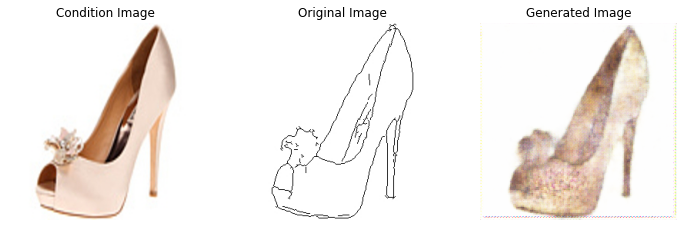

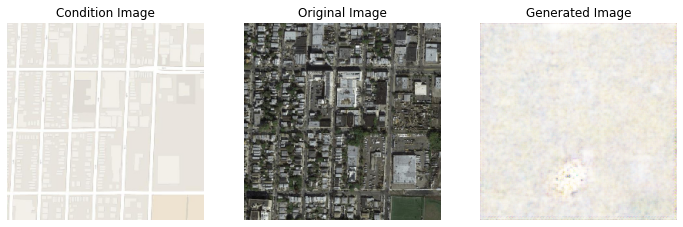

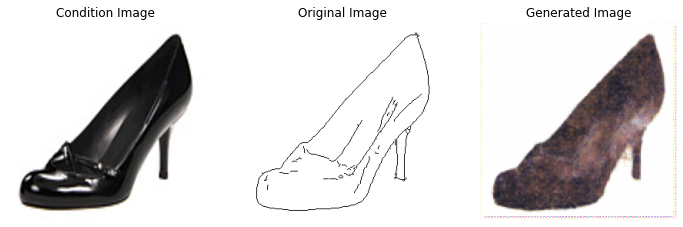

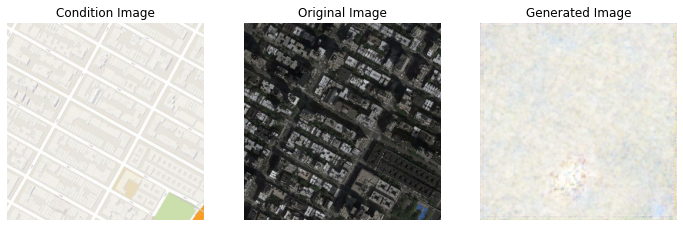

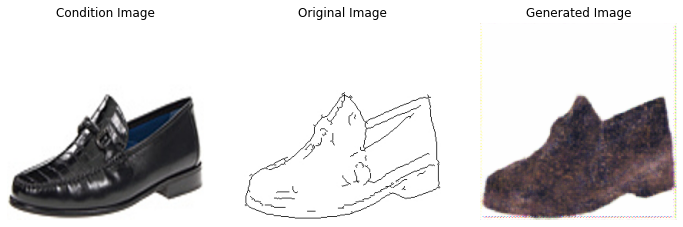

Epoch 11/100, time: 56.42100524902344s
Discriminator loss is 0.00011251492833252996, Generator loss is 15.80212688446045
----------------------------------------------------------------------------------
Epoch 12/100, time: 56.62213158607483s
Discriminator loss is 9.291576861869544e-05, Generator loss is 16.416078567504883
----------------------------------------------------------------------------------
Epoch 13/100, time: 56.79434013366699s
Discriminator loss is 5.6590448366478086e-05, Generator loss is 14.488885879516602
----------------------------------------------------------------------------------
Epoch 14/100, time: 56.586261510849s
Discriminator loss is 6.988909444771707e-05, Generator loss is 15.535176277160645
----------------------------------------------------------------------------------
Epoch 15/100, time: 56.801612854003906s
Discriminator loss is 6.456983101088554e-05, Generator loss is 18.149280548095703
---------------------------------------------------------------

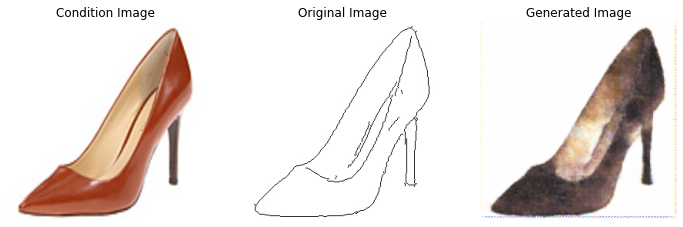

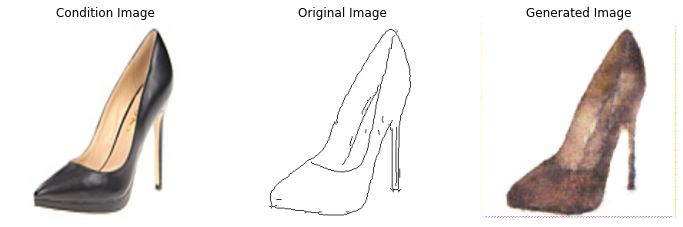

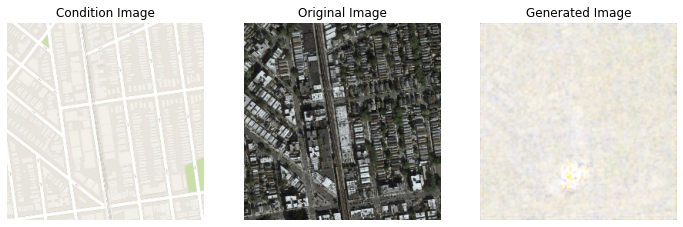

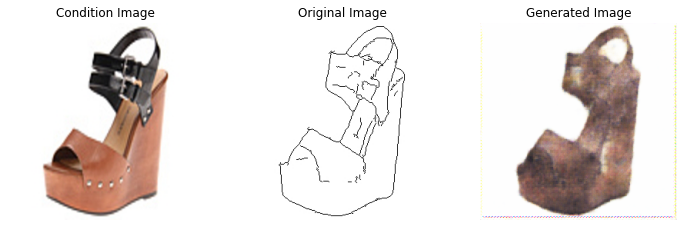

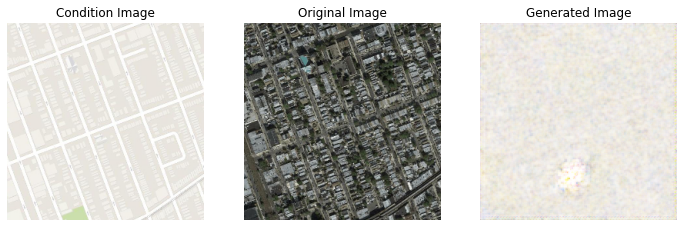

Epoch 21/100, time: 57.49210548400879s
Discriminator loss is 0.010680618695914745, Generator loss is 15.171822547912598
----------------------------------------------------------------------------------
Epoch 22/100, time: 57.08047389984131s
Discriminator loss is 0.002503562718629837, Generator loss is 16.766658782958984
----------------------------------------------------------------------------------
Epoch 23/100, time: 59.20186448097229s
Discriminator loss is 0.0011450457386672497, Generator loss is 12.580694198608398
----------------------------------------------------------------------------------
Epoch 24/100, time: 57.04625153541565s
Discriminator loss is 0.002390805631875992, Generator loss is 15.490224838256836
----------------------------------------------------------------------------------
Epoch 25/100, time: 57.10451078414917s
Discriminator loss is 0.0012320769019424915, Generator loss is 11.935820579528809
------------------------------------------------------------------

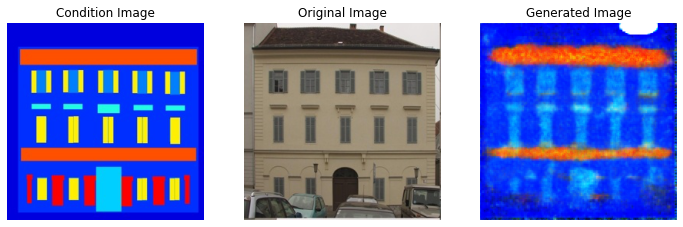

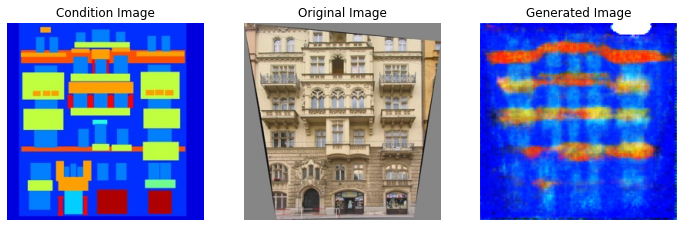

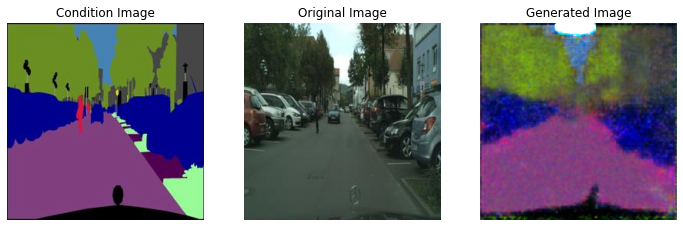

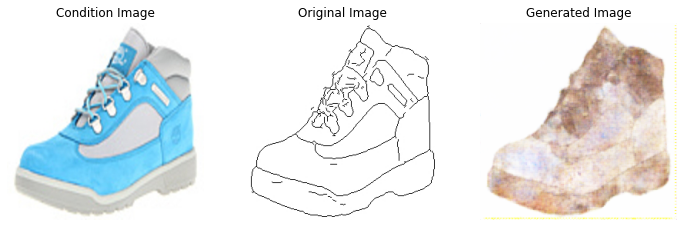

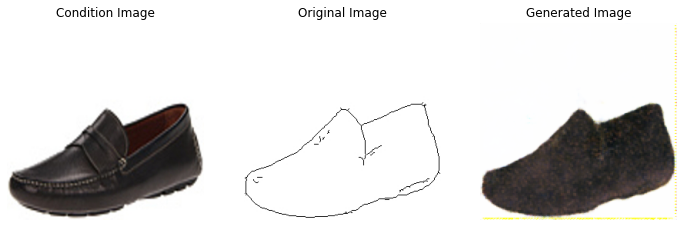

Epoch 31/100, time: 56.9426908493042s
Discriminator loss is 0.0002496678498573601, Generator loss is 14.123781204223633
----------------------------------------------------------------------------------
Epoch 32/100, time: 57.250144720077515s
Discriminator loss is 0.0001246622414328158, Generator loss is 10.916780471801758
----------------------------------------------------------------------------------
Epoch 33/100, time: 57.105021715164185s
Discriminator loss is 0.0001326017372775823, Generator loss is 10.950338363647461
----------------------------------------------------------------------------------
Epoch 34/100, time: 57.03450846672058s
Discriminator loss is 0.0001455793681088835, Generator loss is 14.953110694885254
----------------------------------------------------------------------------------
Epoch 35/100, time: 57.15219712257385s
Discriminator loss is 0.00010611323523335159, Generator loss is 11.81883716583252
--------------------------------------------------------------

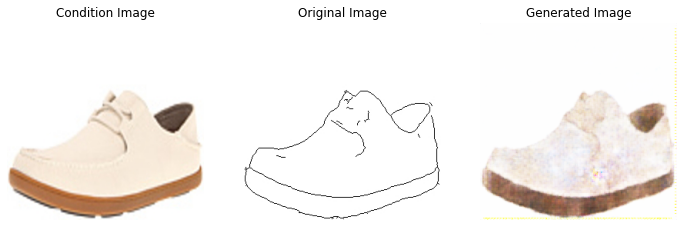

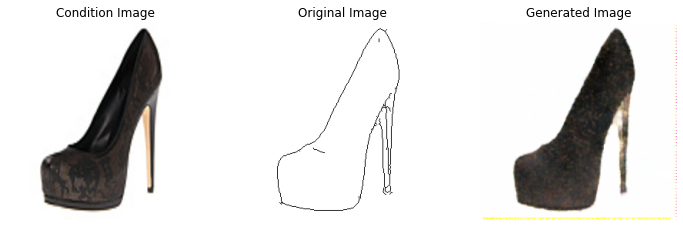

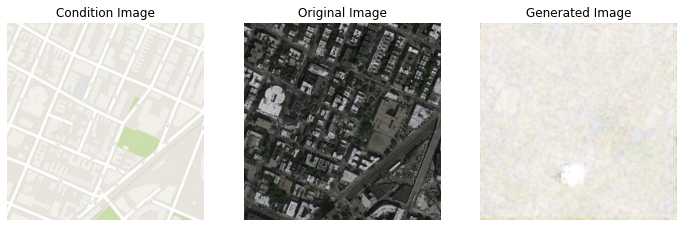

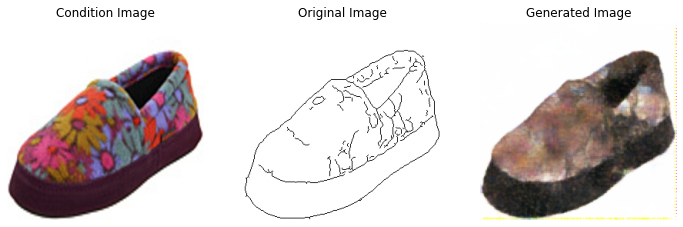

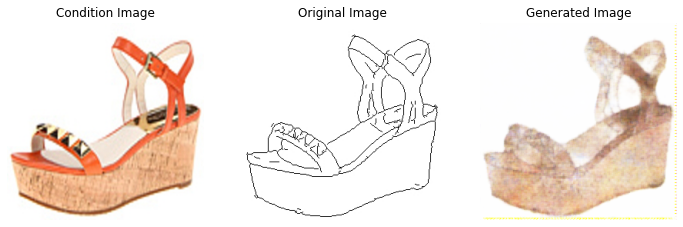

Epoch 41/100, time: 57.233272075653076s
Discriminator loss is 5.04005110997241e-05, Generator loss is 9.759973526000977
----------------------------------------------------------------------------------
Epoch 42/100, time: 57.14204001426697s
Discriminator loss is 4.6067681978456676e-05, Generator loss is 10.66828727722168
----------------------------------------------------------------------------------
Epoch 43/100, time: 57.230058431625366s
Discriminator loss is 3.849672066280618e-05, Generator loss is 12.483911514282227
----------------------------------------------------------------------------------
Epoch 44/100, time: 57.069695234298706s
Discriminator loss is 3.753734199563041e-05, Generator loss is 11.216347694396973
----------------------------------------------------------------------------------
Epoch 45/100, time: 57.392287254333496s
Discriminator loss is 3.551626650732942e-05, Generator loss is 14.06184196472168
--------------------------------------------------------------

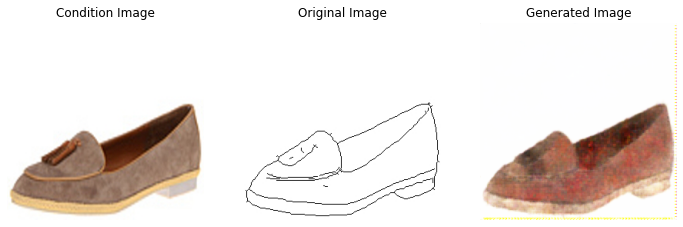

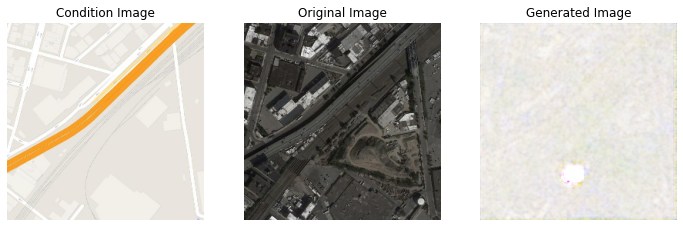

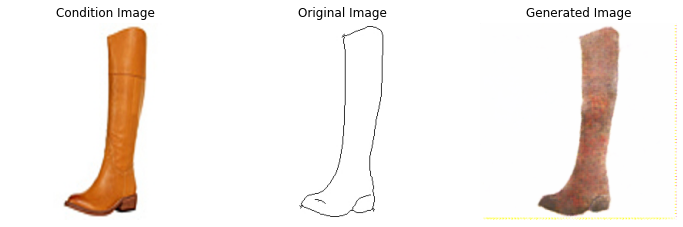

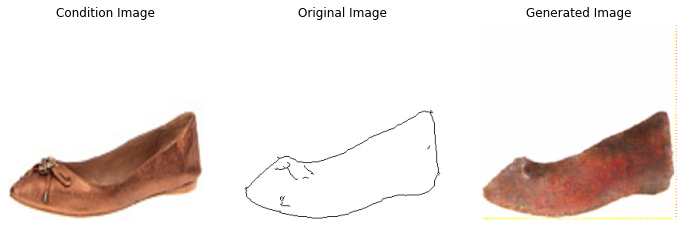

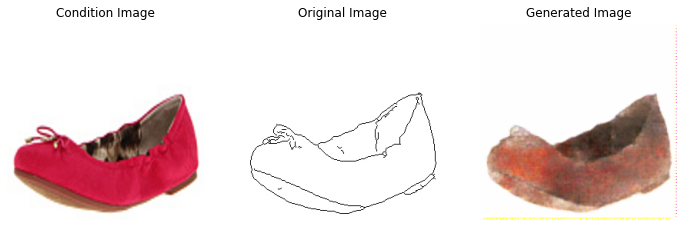

Epoch 51/100, time: 57.01245474815369s
Discriminator loss is 1.940991569426842e-05, Generator loss is 12.95173454284668
----------------------------------------------------------------------------------
Epoch 52/100, time: 57.0670006275177s
Discriminator loss is 1.4957146959204692e-05, Generator loss is 9.998978614807129
----------------------------------------------------------------------------------
Epoch 53/100, time: 57.01808953285217s
Discriminator loss is 1.4650504454039037e-05, Generator loss is 9.978193283081055
----------------------------------------------------------------------------------
Epoch 54/100, time: 57.47799873352051s
Discriminator loss is 1.3907312677474692e-05, Generator loss is 9.501019477844238
----------------------------------------------------------------------------------
Epoch 55/100, time: 57.03601002693176s
Discriminator loss is 1.169345159723889e-05, Generator loss is 9.61453914642334
-------------------------------------------------------------------

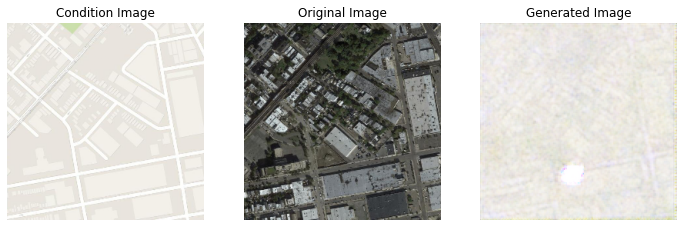

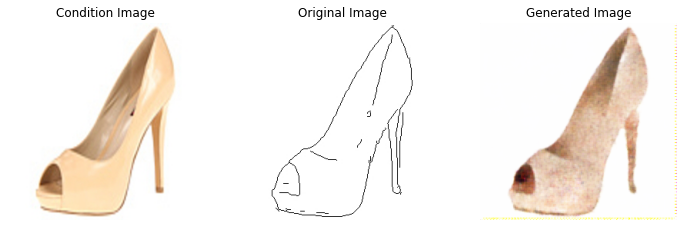

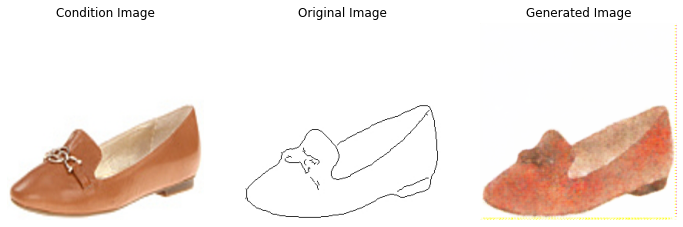

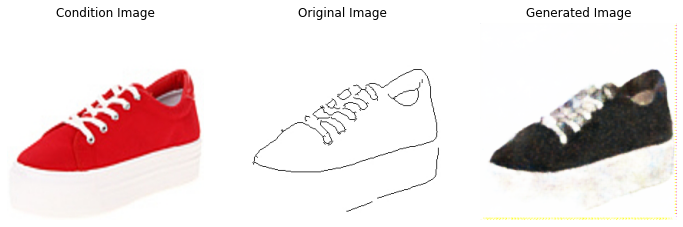

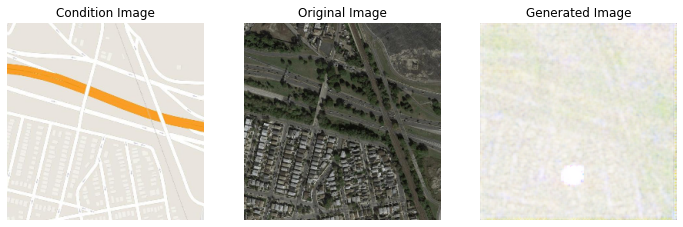

Epoch 61/100, time: 57.6731436252594s
Discriminator loss is 6.5942540459218435e-06, Generator loss is 9.343184471130371
----------------------------------------------------------------------------------
Epoch 62/100, time: 57.019896268844604s
Discriminator loss is 6.449719421652844e-06, Generator loss is 10.338266372680664
----------------------------------------------------------------------------------
Epoch 63/100, time: 57.37565493583679s
Discriminator loss is 2.900540130212903e-05, Generator loss is 13.394939422607422
----------------------------------------------------------------------------------
Epoch 64/100, time: 57.524006843566895s
Discriminator loss is 0.0022379951551556587, Generator loss is 11.597545623779297
----------------------------------------------------------------------------------
Epoch 65/100, time: 57.21782088279724s
Discriminator loss is 0.00030468706972897053, Generator loss is 12.048382759094238
-------------------------------------------------------------

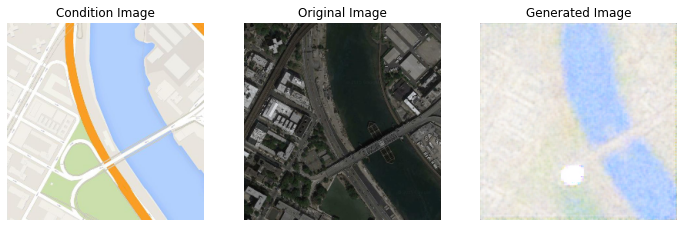

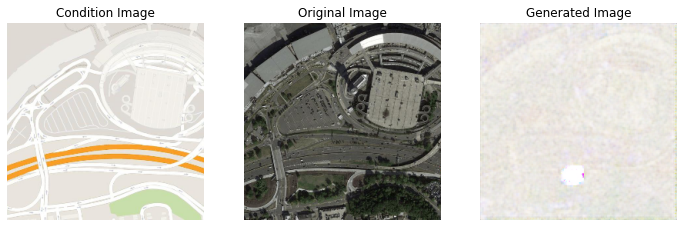

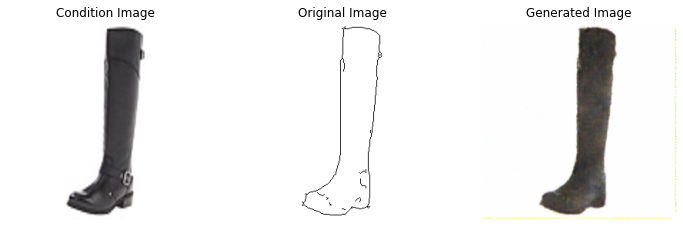

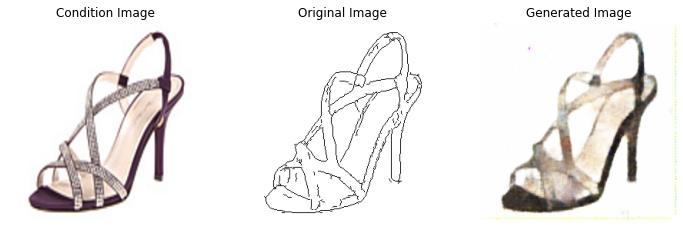

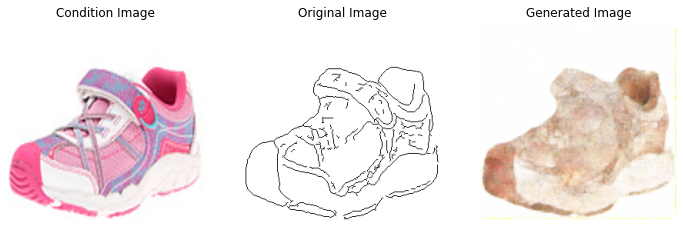

Epoch 71/100, time: 57.15126848220825s
Discriminator loss is 6.770327308913693e-05, Generator loss is 9.668391227722168
----------------------------------------------------------------------------------
Epoch 72/100, time: 57.03100085258484s
Discriminator loss is 3.749899406102486e-05, Generator loss is 8.27547550201416
----------------------------------------------------------------------------------
Epoch 73/100, time: 57.179606199264526s
Discriminator loss is 5.4685577197233215e-05, Generator loss is 10.238152503967285
----------------------------------------------------------------------------------
Epoch 74/100, time: 57.05800127983093s
Discriminator loss is 4.690782225225121e-05, Generator loss is 8.508021354675293
----------------------------------------------------------------------------------
Epoch 75/100, time: 57.59599304199219s
Discriminator loss is 6.0197322454769164e-05, Generator loss is 9.804723739624023
-----------------------------------------------------------------

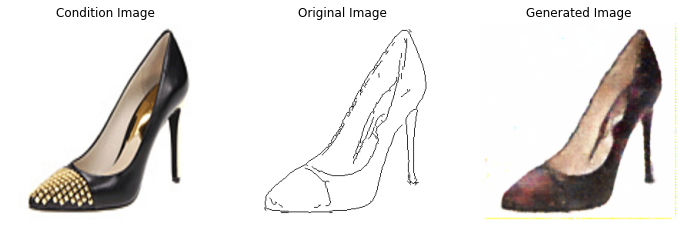

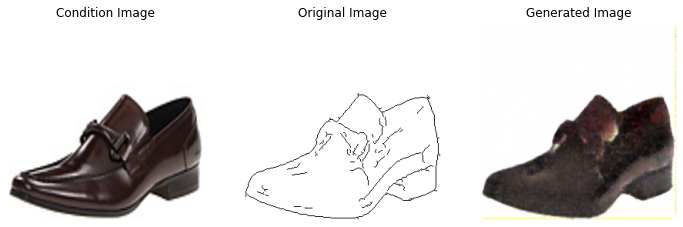

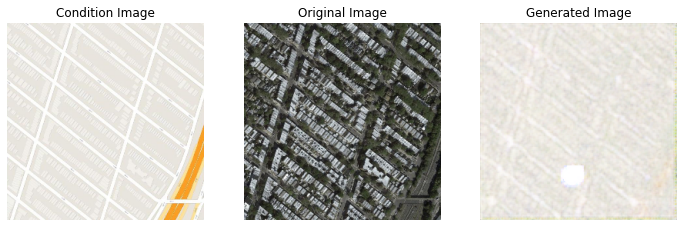

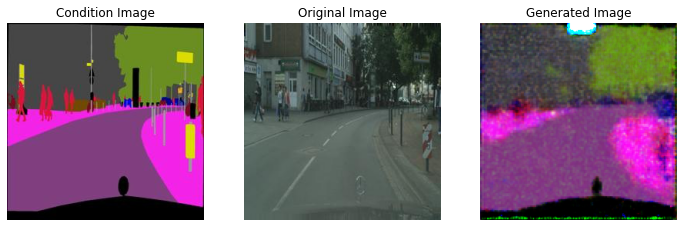

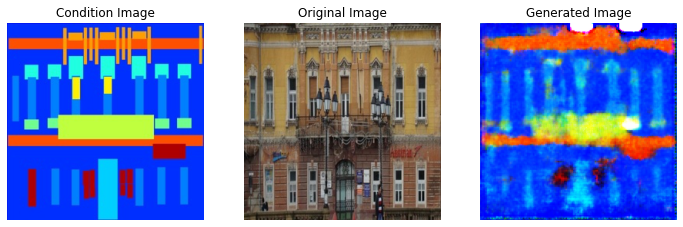

Epoch 81/100, time: 57.46400165557861s
Discriminator loss is 1.5286361303878948e-05, Generator loss is 8.766133308410645
----------------------------------------------------------------------------------
Epoch 82/100, time: 59.098761558532715s
Discriminator loss is 1.2103069821023382e-05, Generator loss is 7.8293304443359375
----------------------------------------------------------------------------------
Epoch 83/100, time: 57.977996826171875s
Discriminator loss is 1.762585452524945e-05, Generator loss is 7.6143798828125
----------------------------------------------------------------------------------
Epoch 84/100, time: 57.83099699020386s
Discriminator loss is 1.1609276043600403e-05, Generator loss is 7.949225425720215
----------------------------------------------------------------------------------
Epoch 85/100, time: 57.34597110748291s
Discriminator loss is 1.0859937901841477e-05, Generator loss is 9.297483444213867
---------------------------------------------------------------

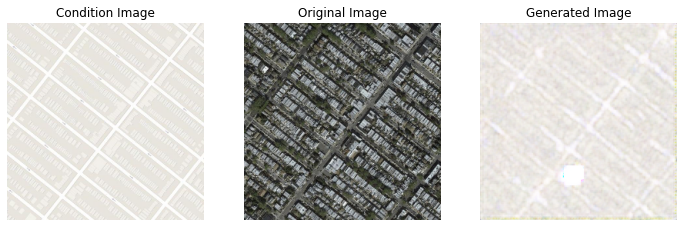

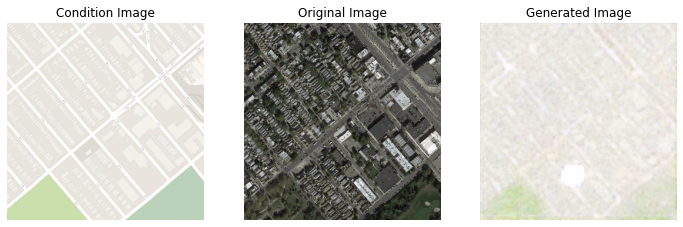

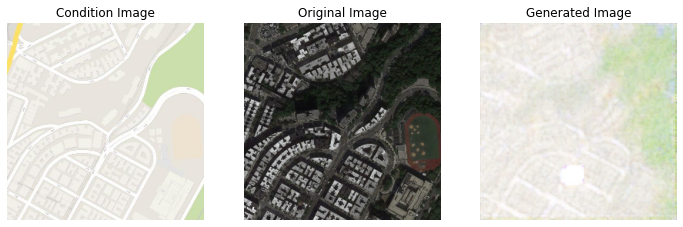

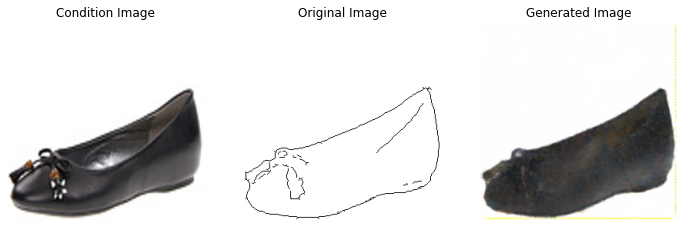

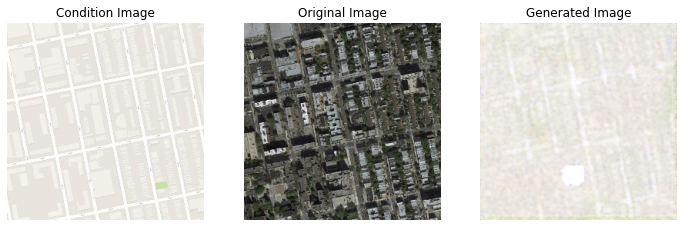

Epoch 91/100, time: 60.74499750137329s
Discriminator loss is 5.954338575975271e-06, Generator loss is 9.433749198913574
----------------------------------------------------------------------------------
Epoch 92/100, time: 59.81762099266052s
Discriminator loss is 0.00032514528720639646, Generator loss is 10.744331359863281
----------------------------------------------------------------------------------
Epoch 93/100, time: 59.718254804611206s
Discriminator loss is 0.00017238465079572052, Generator loss is 9.513274192810059
----------------------------------------------------------------------------------
Epoch 94/100, time: 59.6639678478241s
Discriminator loss is 0.00023322894412558526, Generator loss is 8.28368091583252
----------------------------------------------------------------------------------
Epoch 95/100, time: 60.30255699157715s
Discriminator loss is 7.916890899650753e-05, Generator loss is 10.245543479919434
----------------------------------------------------------------

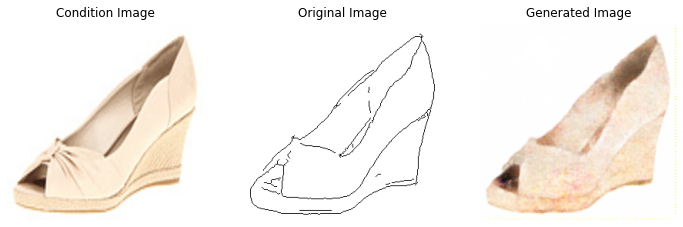

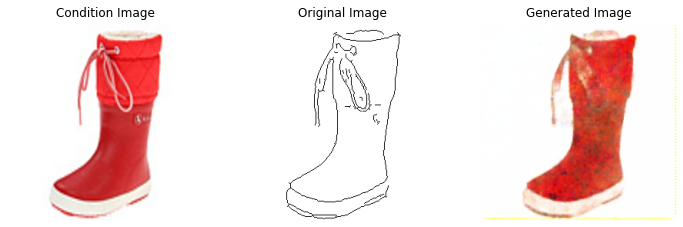

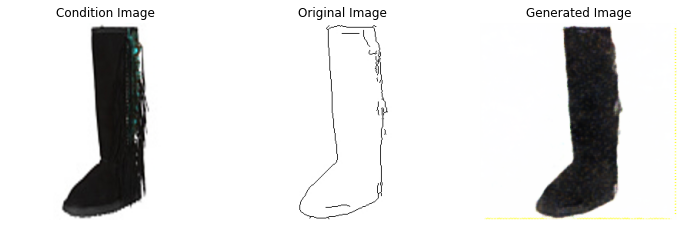

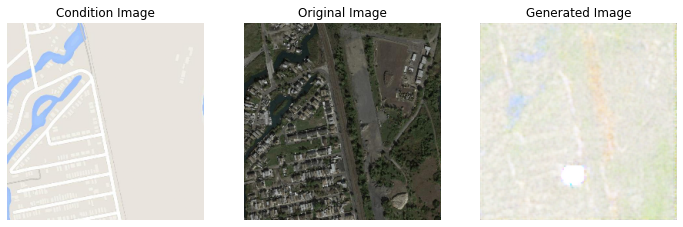

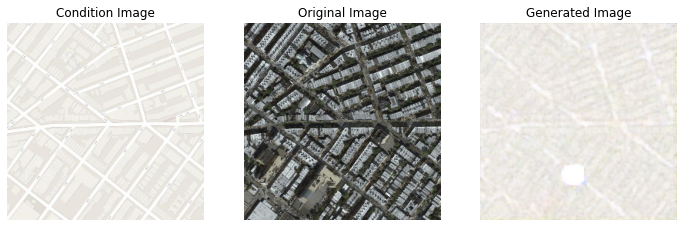

Total time of training is 5780.553222417831s


In [19]:
# model training
EPOCH = 100

prediction = train_gan(g_model=generator,
                       d_model=discriminator,
                       data_loader=dataloader,
                       n_epochs=EPOCH,
                       show_image_epoch=10)

### Show performance of model

In [20]:
input_images, predicted_images, dis_loss, gen_loss = prediction

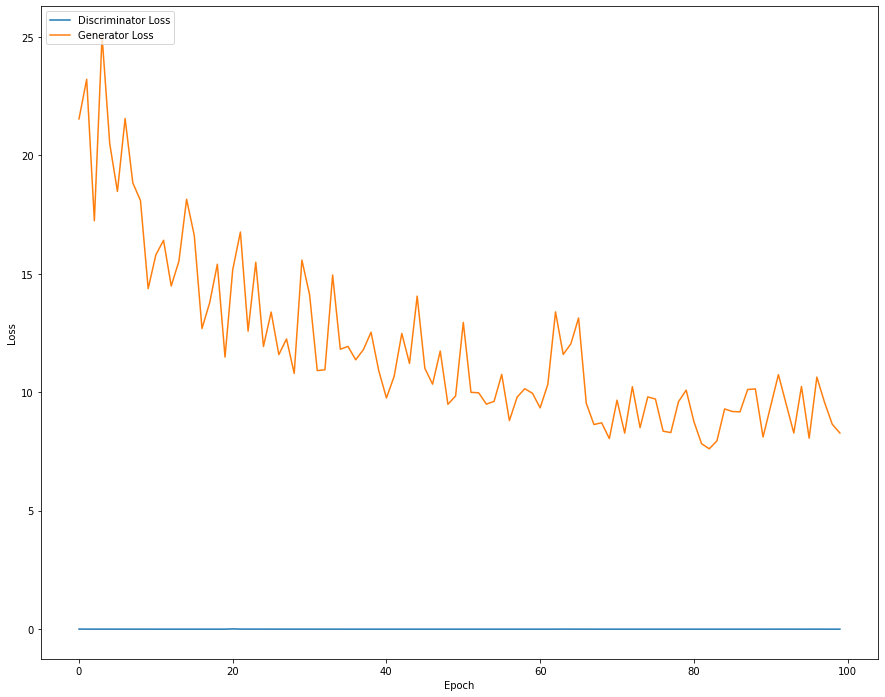

In [21]:
plt.figure(figsize=(15,12))
plt.plot(np.arange(len(dis_loss)), dis_loss, label='Discriminator Loss')
plt.plot(np.arange(len(gen_loss)), gen_loss, label='Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.show()

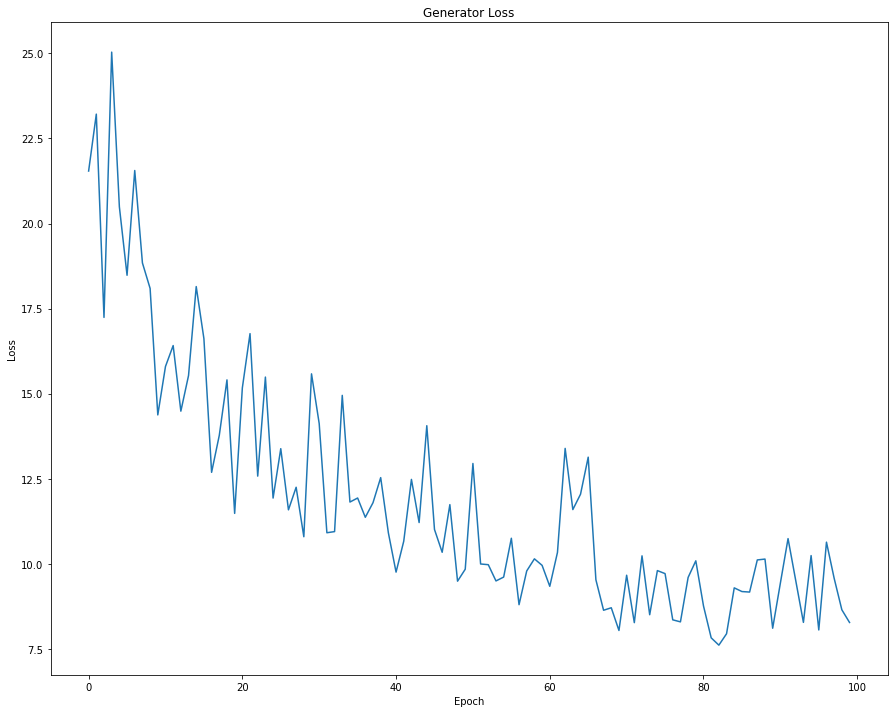

In [22]:
plt.figure(figsize=(15,12))
plt.plot(np.arange(len(gen_loss)), gen_loss)
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

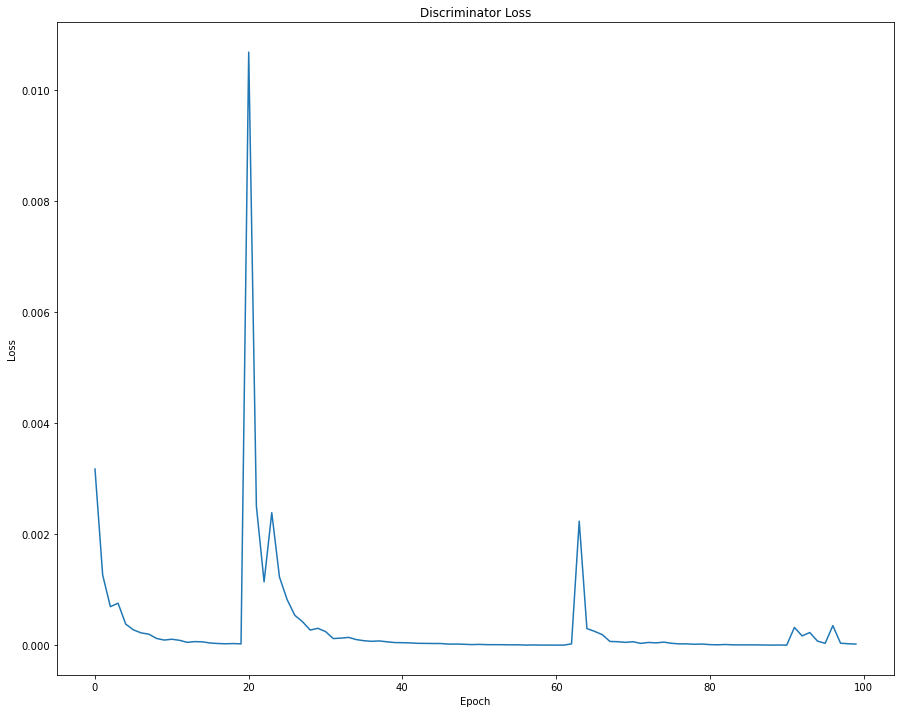

In [23]:
plt.figure(figsize=(15,12))
plt.plot(np.arange(len(dis_loss)), dis_loss)
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

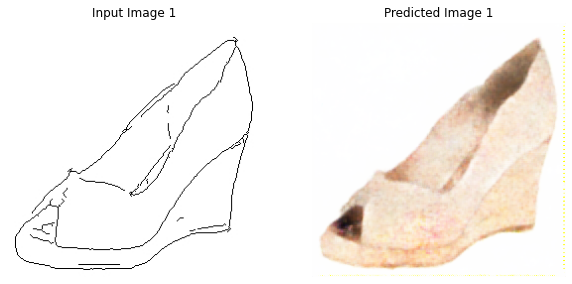

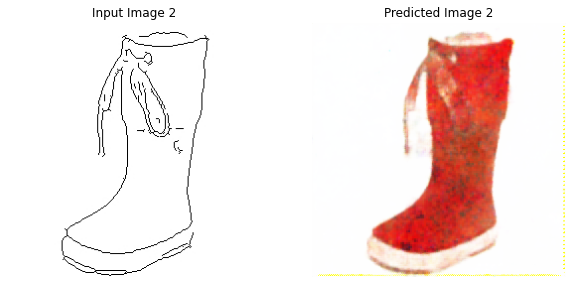

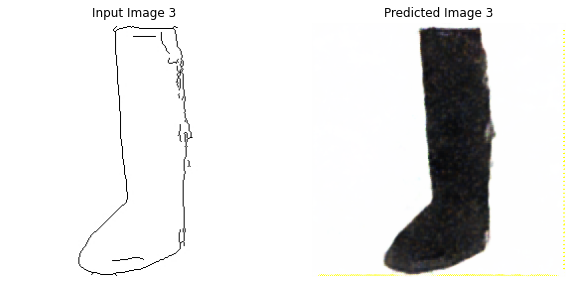

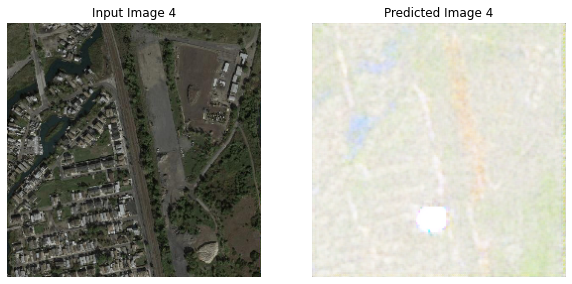

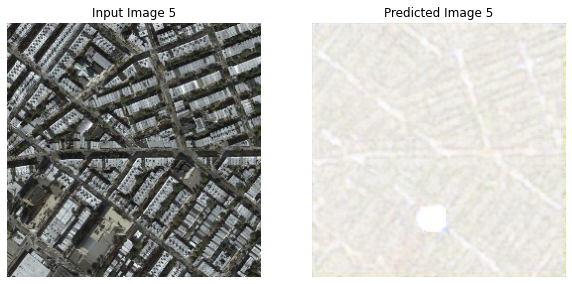

...

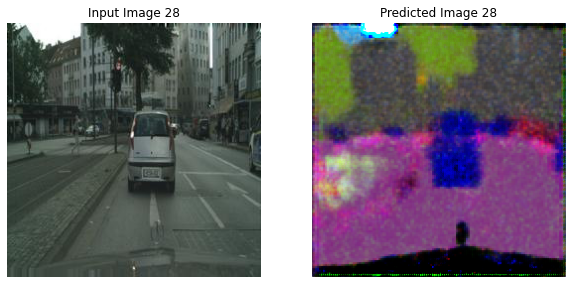

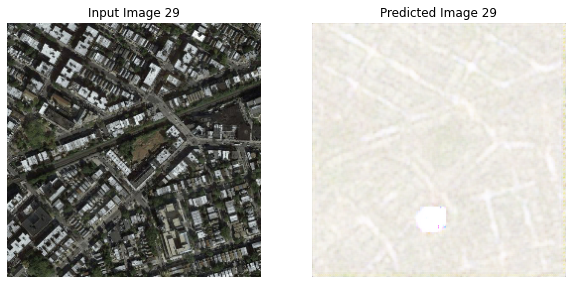

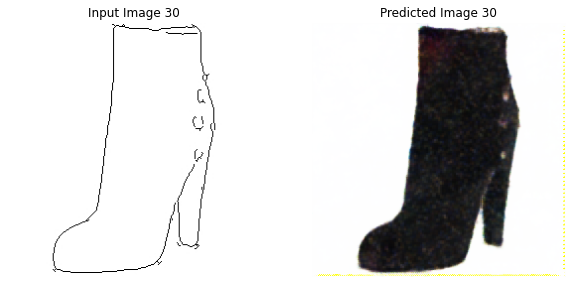

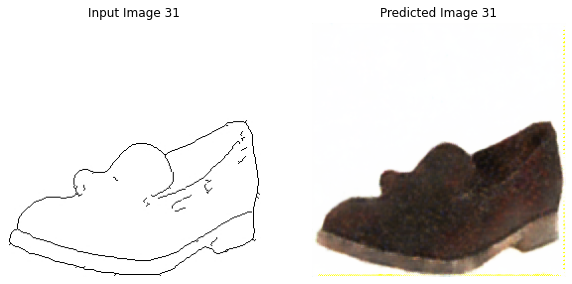

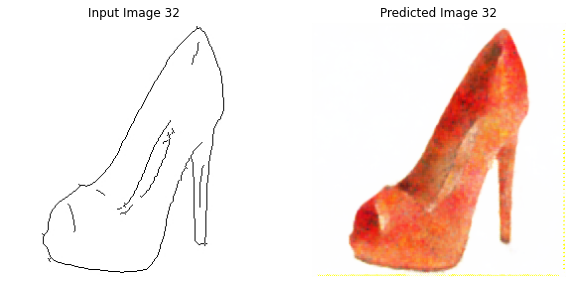

In [24]:
# show result of model
def show_result(ncols, images, predicted):
    for i in range(ncols):
        plt.figure(figsize=(10,5))
        plt.subplot(121)
        img = images[i].detach().cpu().numpy()
        torch_to_numpy(img)
        plt.title(f'Input Image {i+1}')
        plt.subplot(122)
        pred = predicted[i].detach().cpu().numpy()
        torch_to_numpy(pred)
        plt.title(f'Predicted Image {i+1}')
        plt.show()

show_result(32, input_images, predicted_images)